In [1]:
import sys
sys.path.append("../../")
DATA_PATH = "../../data/"
SAVE_PATH = "../../plots"

import matplotlib.pyplot as plt
import numpy as np
import py_common.utility as utility
from py_common.units import *
from py_common.scattering_dependence import *
from py_common.bounds_dependence import *
from py_common.wave_function import *
from matplotlib.collections import LineCollection
import itertools
from matplotlib.figure import Figure
from matplotlib.axes import Axes
from py_common.utility import AxesArray
from ipywidgets import interact
import pickle
from py_common.aggregate_outputs import *

plt.rcParams.update({'font.size': 18})

n_colors = ["#FF0088", "#00FF9D", "#0BA6FF", "#8C0AE2"]
BINS = [-0.246, -1.660, -5.280]
ROT_CONST = 0.24975935 * CMINV / GHZ

reference_singlet = np.loadtxt(f"{DATA_PATH}/srf_rb_bounds_n_175_singlet.dat")
reference_singlet_scaled_1 = np.loadtxt(f"{DATA_PATH}/srf_rb_bounds_n_175_singlet_scaled_1.dat")

reference_triplet = np.loadtxt(f"{DATA_PATH}/srf_rb_bounds_n_175_triplet.dat")
reference_triplet_scaled_1 = np.loadtxt(f"{DATA_PATH}/srf_rb_bounds_n_175_triplet_scaled_1.dat")

colors = ["red", "green", "blue", "purple", "navy", "black"]

def bounds_loss(bounds, bounds_true):
    chi = 0
    for i, b in enumerate(bounds_true):
        if i >= len(bounds):
            chi += 1
        else:
            chi += (np.log2(bounds[i] / b))**2
    chi /= i # type: ignore
    
    return chi

def bounds_losses(bounds, bounds_true):
    fields = np.unique(bounds.data[:, 0])

    losses = []
    for bounds_single in bounds.fields():
        losses.append(bounds_loss(bounds_single[:, 1], bounds_true))

    return np.array([np.array(fields), np.array(losses)])

def plot_bounds(ax: Axes, bounds: BoundsDependence, x_scaled = lambda x: x):
    for state in bounds.states():
        points = np.column_stack([x_scaled(state[:, 0]), np.cbrt(state[:, 1])])
        segments = np.stack([points[:-1], points[1:]], axis=1)
        colors = np.column_stack([state[:, 2], state[:, 3], state[:, 4]])
        
        lc = LineCollection(segments, colors=colors[:-1]) # type: ignore
        
        ax.add_collection(lc)
        ax.update_datalim(points)
    ax.autoscale_view()

def plot_2d_bounds(
    bound_dependence: BoundsDependence2D, 
    reference: npt.NDArray[np.float64], 
    axis: int = 1, 
    c6_mult = 1.,
    label = "scaling view factor ="
) -> tuple[Figure, AxesArray]:
    fig, axes = utility.plot_many(1, 2, shape=(15, 5), sharex = True)

    def update(scaling_index = 0):
        for art in list(axes[0].lines):
            art.remove()
        for art in list(axes[0].collections):
            art.remove()

        bounds_index, scaling_view = bound_dependence.slice(scaling_index, axis)

        for state in bounds_index.states():
            if state.shape[1] == 3:
                axes[0].plot(state[:, 0], np.cbrt(state[:, 1]), color="blue")
            else:
                points = np.column_stack([state[:, 0], np.cbrt(state[:, 1])])
                segments = np.stack([points[:-1], points[1:]], axis=1)
                colors = np.column_stack([state[:, 2], state[:, 3], state[:, 4]])

                lc = LineCollection(segments, colors=colors[:-1]) # type: ignore
                
                axes[0].add_collection(lc)

        for b in reference:
            axes[0].axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

        for b in BINS:
            axes[0].axhline(np.cbrt(b / c6_mult**0.5), color = "black", linestyle="--", linewidth=0.5)

        for art in list(axes[1].lines):
            art.remove()

        chi2 = bounds_losses(bounds_index, reference)
        axes[1].plot(chi2[0, :], chi2[1, :], color = "blue")

        fig.suptitle(f"{label} {scaling_view:.4f}")

        fig.canvas.draw_idle()
    
    update(scaling_index=0)

    interact(update, scaling_index = (0, bound_dependence.slice_len(axis) - 1))

    return fig, axes

@dataclass
class WKBLevel:
    n: int
    slope: float
    energy_diss: float
    intercept: float

    def levels_cbrt(self, lambd):
        return np.cbrt(self.energy_diss - np.power(self.slope * (np.sqrt(lambd) - self.intercept), 3) / np.sqrt(lambd))

class WKBLevels:
    levels: list[WKBLevel]
    slope: float
    rot_const: float
    spacing: float
    range_lambda: tuple[float, float]
    range_level_cbrt: tuple[float, float]

    def __init__(self, slope: float, rot_const: float, spacing: float, range_lambda: tuple[float, float], range_level_cbrt: tuple[float, float]):
        self.levels = []
        self.slope = slope
        self.rot_const = rot_const
        self.spacing = spacing
        self.range_lambda = range_lambda
        self.range_level_cbrt = range_level_cbrt

    # @staticmethod
    # def from_n_0(self, first, range_lambda: tuple[float, float], range_level_cbrt: tuple[float, float]) -> 'WKBLevels':
    #    pass

    def add_level_cbrt(self, n: int, point: tuple[float, float], slope: float | None = None, spacing: float | None = None):
        spacing = spacing if spacing is not None else self.spacing
        slope = slope if slope is not None else self.slope

        assert point[0] >= self.range_lambda[0] and point[0] <= self.range_lambda[1]
        assert point[1] >= self.range_level_cbrt[0] and point[1] <= self.range_level_cbrt[1]

        energy_diss = n * (n + 1) * self.rot_const
        intercept = np.cbrt(point[1]**3 * np.sqrt(point[0]) - energy_diss) / slope + np.sqrt(point[0])

        lowest_intercept = np.cbrt(self.range_level_cbrt[0]**3 * np.sqrt(self.range_lambda[0]) - energy_diss) / slope + np.sqrt(self.range_lambda[0])
        highest_intercept = np.cbrt(self.range_level_cbrt[1]**3 * np.sqrt(self.range_lambda[1]) - energy_diss) / slope + np.sqrt(self.range_lambda[1])

        k_min = int(np.ceil((lowest_intercept - intercept) / spacing))
        k_max = int(np.floor((highest_intercept - intercept) / spacing))

        for k in range(k_min, k_max + 1):
            self.levels.append(WKBLevel(n, slope, energy_diss, intercept + k * spacing))


from matplotlib.figure import Figure
from py_common.utility import AxesArray

def plot_2d(bound_dependence: BoundsDependence2D, reference: npt.NDArray[np.float64], axis: int = 1) -> tuple[Figure, AxesArray]:
    fig, axes = utility.plot_many(1, 2, shape=(15, 5), sharex = True)

    bounds_init, scaling_view = bound_dependence.slice(0, axis)
    for state in bounds_init.states():
        if state.shape[1] == 3:
            axes[0].plot(state[:, 0], state[:, 1], color="blue")
        else:
            points = np.column_stack([state[:, 0], state[:, 1]])
            segments = np.stack([points[:-1], points[1:]], axis=1)
            colors = np.column_stack([state[:, 2], state[:, 3], state[:, 4]])
            
            lc = LineCollection(segments, colors=colors[:-1]) # type: ignore
            
            axes[0].add_collection(lc)

    for b in reference:
        axes[0].axhline(b, color = "red", linestyle="--", linewidth=1)

    for b in BINS:
        axes[0].axhline(b, color = "black", linestyle="--", linewidth=0.5)
        
    fig.suptitle(f"scaling view factor {scaling_view:.4f}")

    def update(scaling_index = 0):
        for art in list(axes[0].lines):
            art.remove()
        for art in list(axes[0].collections):
            art.remove()

        bounds_index, scaling_view = bound_dependence.slice(scaling_index, axis)

        for state in bounds_index.states():
            if state.shape[1] == 3:
                axes[0].plot(state[:, 0], state[:, 1], color="blue")
            else:
                points = np.column_stack([state[:, 0], state[:, 1]])
                segments = np.stack([points[:-1], points[1:]], axis=1)
                colors = np.column_stack([state[:, 2], state[:, 3], state[:, 4]])
                
                lc = LineCollection(segments, colors=colors[:-1]) # type: ignore
                
                axes[0].add_collection(lc)

        for b in reference:
            axes[0].axhline(b, color = "red", linestyle="--", linewidth=1)

        for b in BINS:
            axes[0].axhline(b, color = "black", linestyle="--", linewidth=0.5)

        for art in list(axes[1].lines):
            art.remove()
        chi2 = bounds_losses(bounds_index, reference)
        axes[1].plot(chi2[0, :], chi2[1, :], color = "blue")

        fig.suptitle(f"scaling view factor {scaling_view:.4f}")

        fig.canvas.draw_idle()

    interact(update, scaling_index = (0, bound_dependence.slice_len(axis) - 1))

    return fig, axes

In [8]:
%matplotlib inline

In [12]:
%matplotlib widget

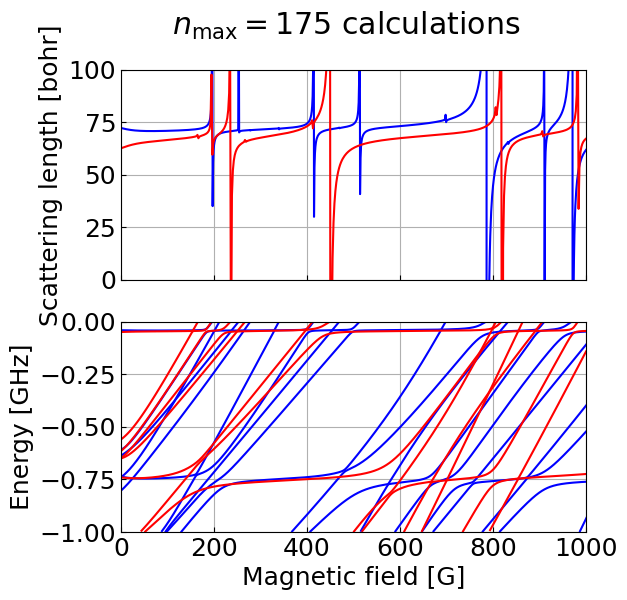

In [13]:
fig, axes = utility.plot_many(2, 1, shape=(6, 6), sharex=True)

filename = f"{DATA_PATH}/molscat_n_max_175_scaled_1.dat"
data = np.loadtxt(filename, delimiter="\t", skiprows=1)

axes[0].plot(data[:, 1], data[:, 2] * ANGS, color = "blue")

axes[0].set_ylabel(f"Scattering length [bohr]")
axes[0].set_ylim(0, 100);

bounds_single = BoundsDependence(f"{DATA_PATH}/bound_n_max_175_scaled_1.dat")
for state in bounds_single.states():
	axes[1].plot(state[:, 0], state[:, 1], color = "blue")
	
axes[1].set_ylabel(f"Energy [GHz]")
axes[1].set_xlabel("Magnetic field [G]")
axes[1].set_ylim(-1, 0);
axes[1].set_xlim(0, 1000);

scatterings = ScatteringDependence.parse_json(f"{DATA_PATH}/SrF_Rb_scattering_n_max_10_scaled_v1.json")
axes[0].plot(scatterings.parameters, scatterings.s_lengths().real, color = "red")

bounds = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_10_scaled_v1.json")
for state in bounds.states():
	axes[1].plot(state[:, 0], state[:, 1], color = "red")

# fig.savefig(f"{SAVE_PATH}/feshbach_n_175.pdf", bbox_inches = "tight")
fig.suptitle(r"$n_\text{max} = 175$ calculations");

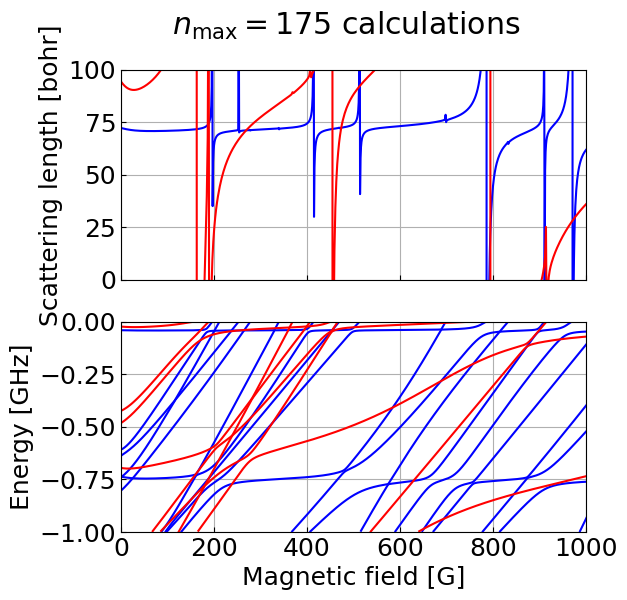

In [8]:
fig, axes = utility.plot_many(2, 1, shape=(6, 6), sharex=True)

filename = f"{DATA_PATH}/molscat_n_max_175_scaled_1.dat"
data = np.loadtxt(filename, delimiter="\t", skiprows=1)

axes[0].plot(data[:, 1], data[:, 2] * ANGS, color = "blue")

axes[0].set_ylabel(f"Scattering length [bohr]")
axes[0].set_ylim(0, 100);

bounds_single = BoundsDependence(f"{DATA_PATH}/bound_n_max_175_scaled_1.dat")
for state in bounds_single.states():
	axes[1].plot(state[:, 0], state[:, 1], color = "blue")
	
axes[1].set_ylabel(f"Energy [GHz]")
axes[1].set_xlabel("Magnetic field [G]")
axes[1].set_ylim(-1, 0);
axes[1].set_xlim(0, 1000);

scatterings = ScatteringDependence.parse_json(f"{DATA_PATH}/SrF_Rb_scattering_n_max_10_morphed.json")
axes[0].plot(scatterings.parameters, scatterings.s_lengths().real, color = "red")

bounds = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_10_morphed.json")
for state in bounds.states():
	axes[1].plot(state[:, 0], state[:, 1], color = "red")

# fig.savefig(f"{SAVE_PATH}/feshbach_n_175.pdf", bbox_inches = "tight")
fig.suptitle(r"$n_\text{max} = 175$ calculations");

# n_max = 10 calculations

## Singlet reconstruction

lambda_1 = 1.3731588;

scaling_c = -0.000636864;

lambda_1 + (scaling - scaling_c) * 21.6 / 20.

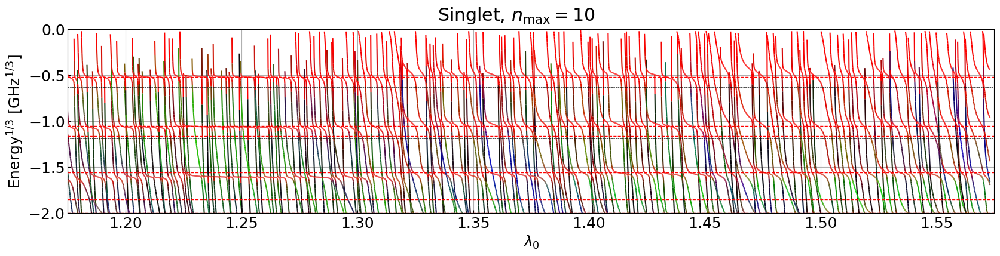

In [12]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_scaling_full_n_max_10_invariant_v2.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);
ax.set_xlim(1.375 - 0.2, 1.375 + 0.2);

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

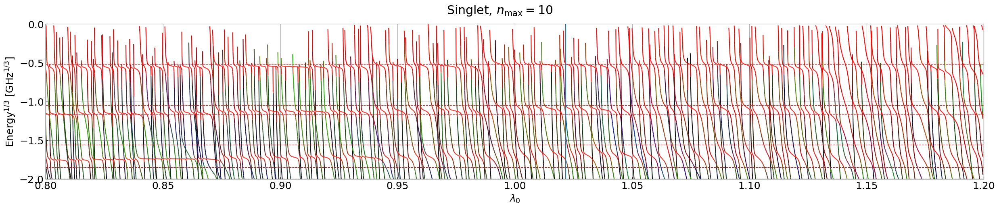

In [ ]:
fig, ax = utility.plot(shape = (30, 5))

bounds = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_scaling_full_n_max_10_invariant_s_1.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);
ax.set_xlim(1.0 - 0.2, 1.0 + 0.2);

ax.axvline(1.02165)
ax.axvline(0.85)
# ax.axvline(1.1628)

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

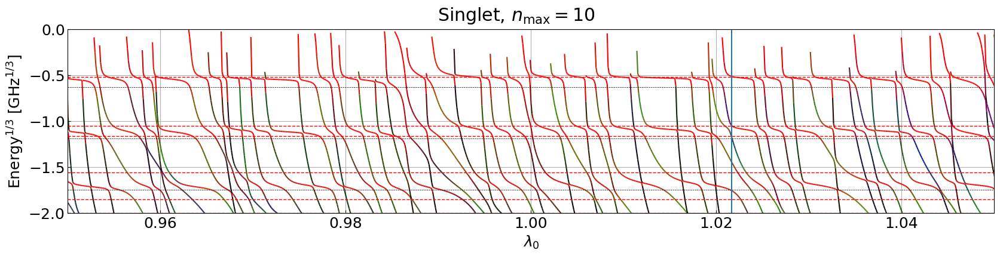

In [6]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_scaling_full_n_max_10_invariant_s_1.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);
ax.set_xlim(1.0 - 0.05, 1.0 + 0.05);

ax.axvline(1.02165)

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

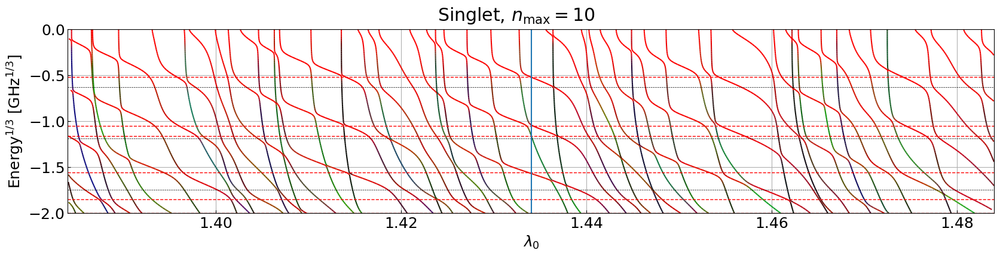

In [19]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_field_json(f"{DATA_PATH}/SrF_Rb_field_singlet_scaling_full_n_max_10_1_43.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);
ax.set_xlim(1.434 - 0.05, 1.434 + 0.05)

ax.axvline(1.4340338097242147)

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

morphing \
[1.4340338097242147, 0.06516772306037935]

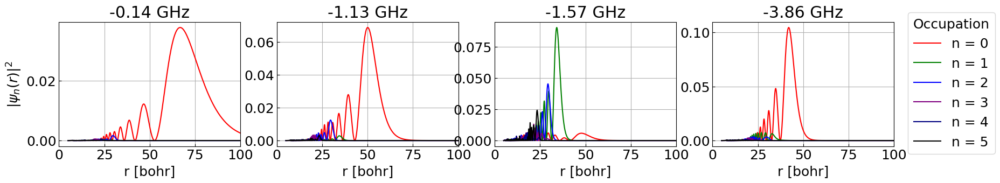

In [33]:
max_coeff = 5
waves = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_10_scaling_1_43.json", take = max_coeff + 1)

take = 4

fig, axes = utility.plot_many(1, take, shape = (5 * take, 3))
axes[0].set_ylabel(r"$|\psi_n(r)|^2$")

for i, (state, wave) in itertools.islice(enumerate(waves.items()), take):
    for j in range(wave.values.shape[1]):
        axes[i].plot(wave.distances, wave.values[:, j]**2, color = colors[j])
    axes[i].set_xlabel("r [bohr]")
    axes[i].set_title(f"{wave.energy:.2f} GHz")
    axes[i].set_xlim(0, 100)

fig.legend([f"n = {j}" for j in range(max_coeff + 1)],
           loc='center right', bbox_to_anchor=(1, 0.5),
           title='Occupation');

# fig.savefig(f"{SAVE_PATH}/wave_function_triplet_scaled_n_10.pdf", bbox_inches = "tight")

interactive(children=(IntSlider(value=0, description='scaling_index', max=20), Output()), _dom_classes=('widge…

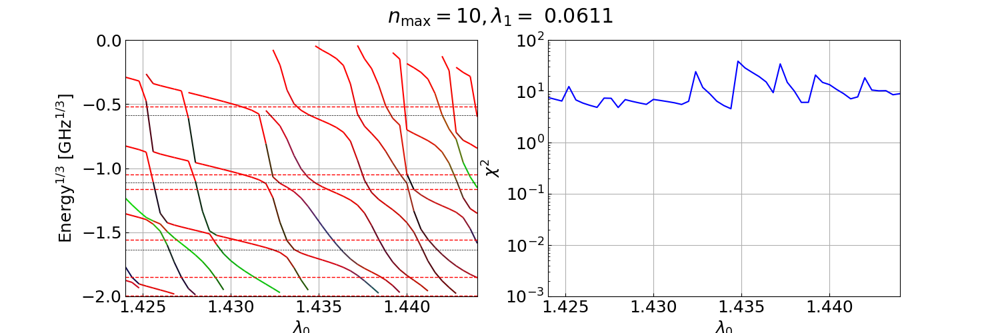

In [2]:
%matplotlib widget

bounds_singlet_2d_zoomed = BoundsDependence2D.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_2d_scaling_legendre_0_legendre_1_n_max_10_morphing_1_43.json")

fig, axes = plot_2d_bounds(bounds_singlet_2d_zoomed, reference_singlet_scaled_1, c6_mult=1.445, label = r"$n_\text{max} = 10, \lambda_1 =$")

axes[0].set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
axes[0].set_xlabel(r"$\lambda_0$")
axes[0].set_ylim(-2, 0)
axes[0].set_xlim(1.434 - 0.01, 1.434 + 0.01)

axes[1].set_yscale("log")
axes[1].set_ylim(1e-3, 1e2)
axes[1].set_ylabel(r"$\chi^2$")
axes[1].set_xlabel(r"$\lambda_0$");

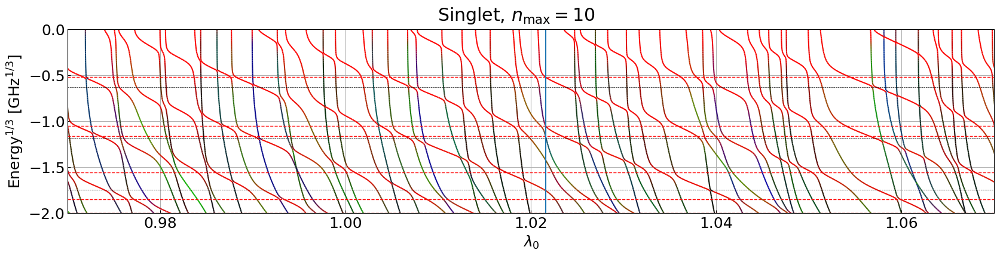

In [10]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_field_json(f"{DATA_PATH}/SrF_Rb_field_singlet_scaling_full_n_max_10_1_02.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);
ax.set_xlim(1.02 - 0.05, 1.02 + 0.05)

ax.axvline(1.021560818780792)

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

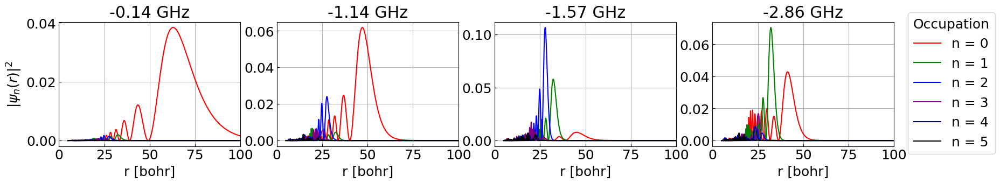

In [11]:
max_coeff = 5
waves = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_10_morphing_02.json", take = max_coeff + 1)

take = 4

fig, axes = utility.plot_many(1, take, shape = (5 * take, 3))
axes[0].set_ylabel(r"$|\psi_n(r)|^2$")

for i, (state, wave) in itertools.islice(enumerate(waves.items()), take):
    for j in range(wave.values.shape[1]):
        axes[i].plot(wave.distances, wave.values[:, j]**2, color = colors[j])
    axes[i].set_xlabel("r [bohr]")
    axes[i].set_title(f"{wave.energy:.2f} GHz")
    axes[i].set_xlim(0, 100)

fig.legend([f"n = {j}" for j in range(max_coeff + 1)],
           loc='center right', bbox_to_anchor=(1, 0.5),
           title='Occupation');

# fig.savefig(f"{SAVE_PATH}/wave_function_triplet_scaled_n_10.pdf", bbox_inches = "tight")

## Triplet reconstruction

lambda_1 = 0.;

scaling_c = 1.003;

lambda_1 + (scaling - scaling_c) * 26. / 20.

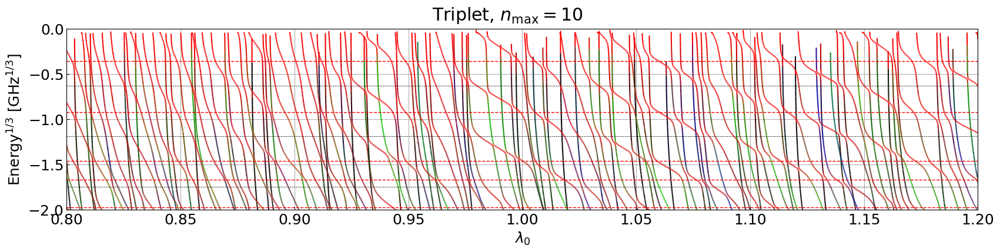

In [50]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_scaling_full_n_max_10_long.json", (1 - 0.2, 1 + 0.2))

plot_bounds(ax, bounds)

for b in reference_triplet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);
ax.set_xlim(1. - 0.2, 1. + 0.2);

# fig.savefig(f"{SAVE_PATH}/srf_rb_triplet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Triplet, $n_\text{max} = 10$");

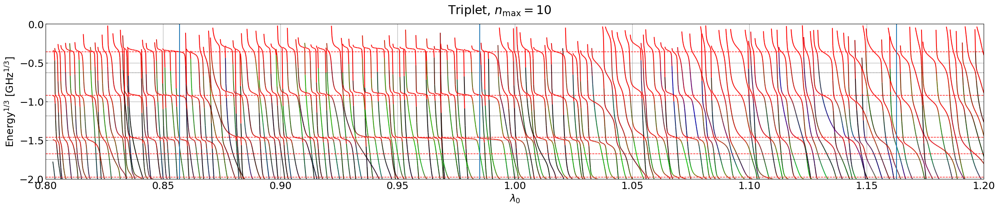

In [19]:
fig, ax = utility.plot(shape = (30, 5))

bounds = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_scaling_full_n_max_10_invariant.json", (1 - 0.2, 1 + 0.2))

plot_bounds(ax, bounds)

for b in reference_triplet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);
ax.set_xlim(1. - 0.2, 1. + 0.2);

ax.axvline(0.9851)
ax.axvline(0.857)
ax.axvline(1.1628)

# fig.savefig(f"{SAVE_PATH}/srf_rb_triplet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Triplet, $n_\text{max} = 10$");

morphing \
[0.9849947036736354, -0.02322520097349072]

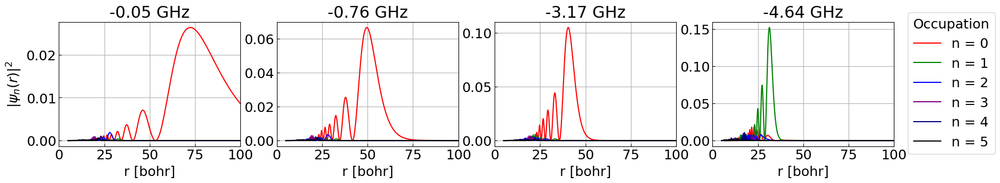

In [11]:
max_coeff = 5
waves = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_wave_functions_n_max_10_morphing_1.json", take = max_coeff + 1)

take = 4

fig, axes = utility.plot_many(1, take, shape = (5 * take, 3))
axes[0].set_ylabel(r"$|\psi_n(r)|^2$")

for i, (state, wave) in itertools.islice(enumerate(waves.items()), take):
    for j in range(wave.values.shape[1]):
        axes[i].plot(wave.distances, wave.values[:, j]**2, color = colors[j])
    axes[i].set_xlabel("r [bohr]")
    axes[i].set_title(f"{wave.energy:.2f} GHz")
    axes[i].set_xlim(0, 100)

fig.legend([f"n = {j}" for j in range(max_coeff + 1)],
           loc='center right', bbox_to_anchor=(1, 0.5),
           title='Occupation');

# fig.savefig(f"{SAVE_PATH}/wave_function_triplet_scaled_n_10.pdf", bbox_inches = "tight")

# ABM

In [3]:
max_coeff = 175
parsed_singlet = parse_wavefunction_file(f'{DATA_PATH}/wave_function_singlet_175.output', 176, max_coeff = max_coeff)
parsed_singlet_scaled = parse_wavefunction_file(f'{DATA_PATH}/wave_function_singlet_175_scaled.output', 176, max_coeff = max_coeff)
parsed_triplet = parse_wavefunction_file(f'{DATA_PATH}/wave_function_triplet_175.output', 176, max_coeff = max_coeff)
parsed_triplet_scaled = parse_wavefunction_file(f'{DATA_PATH}/wave_function_triplet_175_scaled.output', 176, max_coeff = max_coeff)

In [6]:
singlet_waves = list(map(lambda x: x[1], reversed(parsed_singlet.items())))
singlet_scaled_waves = list(map(lambda x: x[1], reversed(parsed_singlet_scaled.items())))
triplet_waves = list(map(lambda x: x[1], reversed(parsed_triplet.items())))
triplet_scaled_waves = list(map(lambda x: x[1], reversed(parsed_triplet_scaled.items())))

In [7]:
import abm_py as abm

rb = abm.HifiProblemBuilder(1, 3)
rb.with_hyperfine_coupling(6.834682610904290 / 2 * GHZ)

srf = abm.HifiProblemBuilder(1, 1)
srf.with_hyperfine_coupling((3.2383e-3 + 1.0096e-3 / 3.) * CMINV)

srf_rb = abm.DoubleHifiProblemBuilder(srf, rb)
srf_rb.with_projection(2)

mag_fields = np.linspace(0, 1000, 500)
states = np.array(srf_rb.build().states_range(mag_fields)) / GHZ

def calc_fc_factors(singlet, triplet):
    return np.trapezoid(np.sum(singlet["coeffs"] * triplet["coeffs"], axis = -1), triplet["r"])

from scipy.interpolate import make_interp_spline
def calc_fc_factors_diff_grid(singlet, triplet):
    spline = make_interp_spline(singlet["r"], singlet["coeffs"])
    singlet_coeffs = spline(triplet["r"])

    return np.trapezoid(np.sum(singlet_coeffs * triplet["coeffs"], axis = -1), triplet["r"])

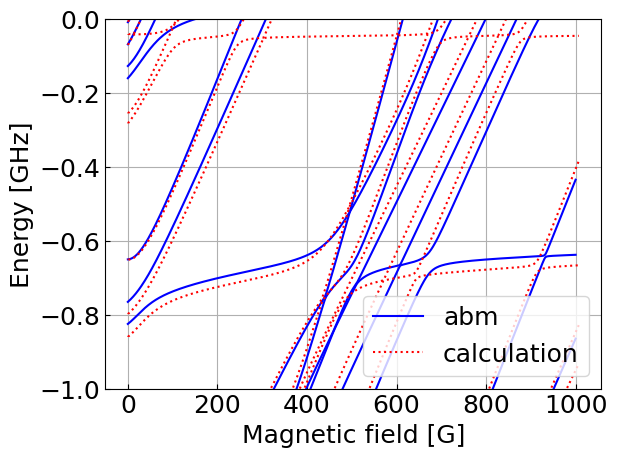

In [7]:
srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlet_energies = np.array(list(map(lambda x: x["energy"], singlet_waves)))[0:7] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplet_waves)))[0:7] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors(singlet_waves[i], triplet_waves[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence(f"{DATA_PATH}/bound_n_max_175.dat")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = ":")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

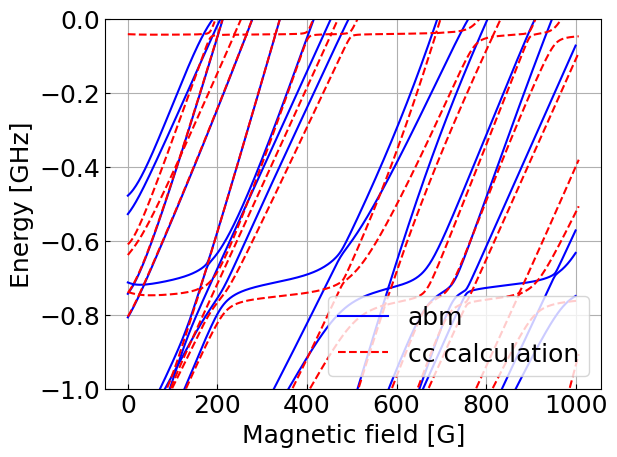

In [ ]:
srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlet_energies = np.array(list(map(lambda x: x["energy"], singlet_scaled_waves)))[0:7] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplet_scaled_waves)))[0:7] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors(singlet_scaled_waves[i], triplet_scaled_waves[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence(f"{DATA_PATH}/bound_n_max_175_scaled_1.dat")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = "--")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "cc calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

# fig.savefig(f"{SAVE_PATH}/SrF_Rb_n_175_abm.pdf", bbox_inches = "tight")

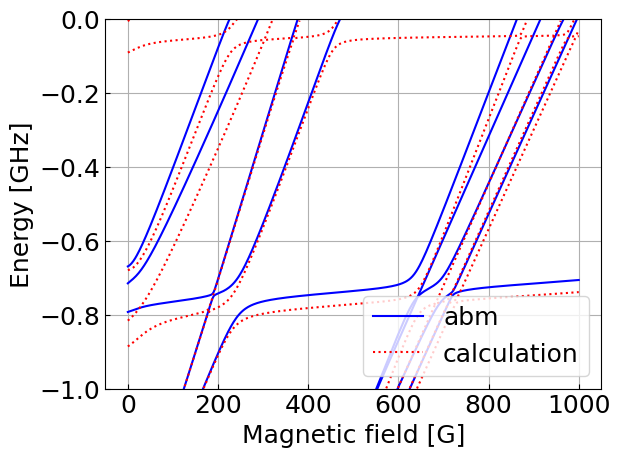

In [21]:
take = 10

srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_10_morphing_02_long.json")
singlets = list(map(lambda x: x[1].to_dict(), singlets.items()))

triplets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_wave_functions_n_max_10_morphing_98_long.json")
triplets = list(map(lambda x: x[1].to_dict(), triplets.items()))

singlet_energies = np.array(list(map(lambda x: x["energy"], singlets)))[0:take] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplets)))[0:take] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors_diff_grid(singlets[i], triplets[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_10_scaled_v2.json")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = ":")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

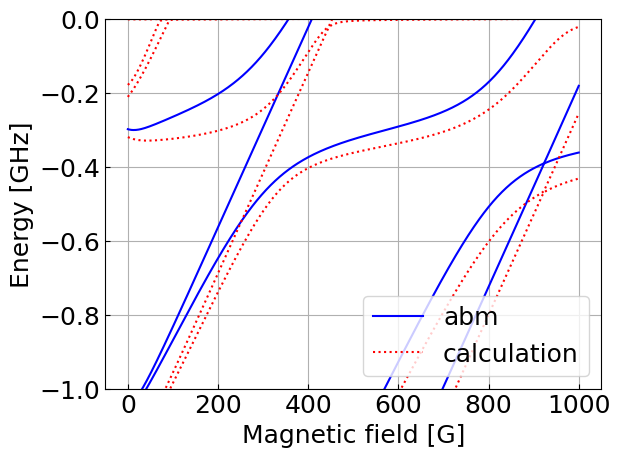

In [44]:
take = 6

srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_0_v2.json")
singlets = list(map(lambda x: x[1].to_dict(), singlets.items()))

triplets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_wave_functions_n_max_0_v2.json")
triplets = list(map(lambda x: x[1].to_dict(), triplets.items()))

singlet_energies = np.array(list(map(lambda x: x["energy"], singlets)))[0:take] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplets)))[0:take] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors_diff_grid(singlets[i], triplets[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_0_v2.json")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = ":")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

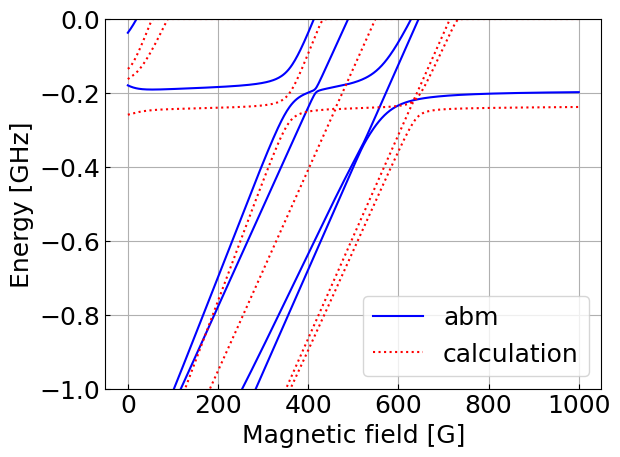

In [45]:
take = 20

srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_1_v2.json")
singlets = list(map(lambda x: x[1].to_dict(), singlets.items()))

triplets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_wave_functions_n_max_1_v2.json")
triplets = list(map(lambda x: x[1].to_dict(), triplets.items()))

singlet_energies = np.array(list(map(lambda x: x["energy"], singlets)))[0:take] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplets)))[0:take] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors_diff_grid(singlets[i], triplets[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_1_v2.json")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = ":")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

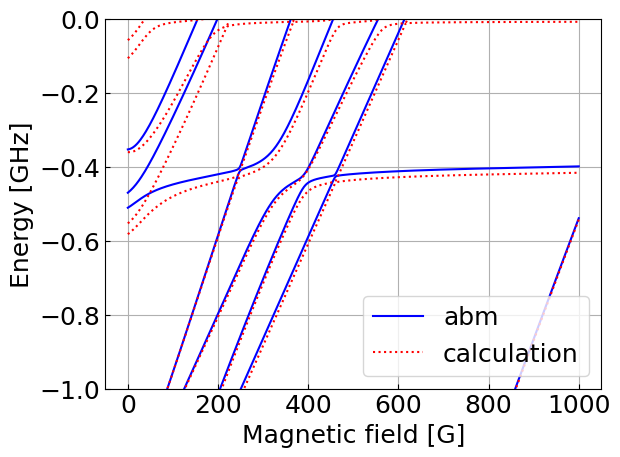

In [35]:
take = 30

srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_2_v2.json")
singlets = list(map(lambda x: x[1].to_dict(), singlets.items()))

triplets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_wave_functions_n_max_2_v2.json")
triplets = list(map(lambda x: x[1].to_dict(), triplets.items()))

singlet_energies = np.array(list(map(lambda x: x["energy"], singlets)))[0:take] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplets)))[0:take] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors_diff_grid(singlets[i], triplets[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_2_v2.json")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = ":")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

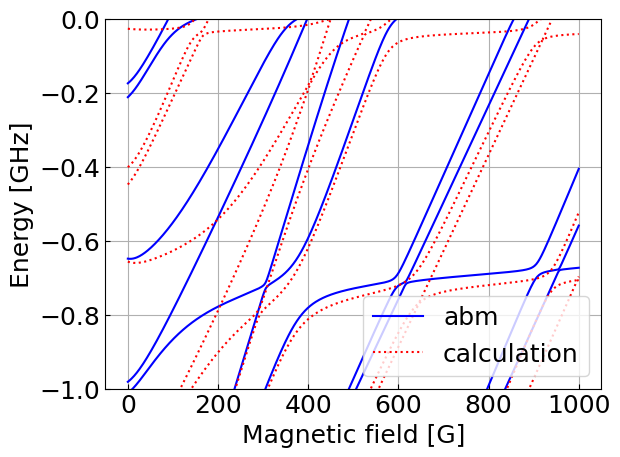

In [37]:
take = 20

srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_5_v2.json")
singlets = list(map(lambda x: x[1].to_dict(), singlets.items()))

triplets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_wave_functions_n_max_5_v2.json")
triplets = list(map(lambda x: x[1].to_dict(), triplets.items()))

singlet_energies = np.array(list(map(lambda x: x["energy"], singlets)))[0:take] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplets)))[0:take] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors_diff_grid(singlets[i], triplets[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_5_v2.json")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = ":")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

In [10]:
import abm_py as abm

rb = abm.HifiProblemBuilder(1, 3)
rb.with_hyperfine_coupling(0.034682610904290 / 2. * GHZ)

srf = abm.HifiProblemBuilder(1, 1)
srf.with_hyperfine_coupling((3.2383e-3 + 1.0096e-3 / 3.) * CMINV)

srf_rb = abm.DoubleHifiProblemBuilder(srf, rb)
srf_rb.with_projection(2)

mag_fields = np.linspace(0, 1000, 500)
states = np.array(srf_rb.build().states_range(mag_fields)) / GHZ

def calc_fc_factors(singlet, triplet):
    return np.trapezoid(np.sum(singlet["coeffs"] * triplet["coeffs"], axis = -1), triplet["r"])

from scipy.interpolate import make_interp_spline
def calc_fc_factors_diff_grid(singlet, triplet):
    spline = make_interp_spline(singlet["r"], singlet["coeffs"])
    singlet_coeffs = spline(triplet["r"])

    return np.trapezoid(np.sum(singlet_coeffs * triplet["coeffs"], axis = -1), triplet["r"])

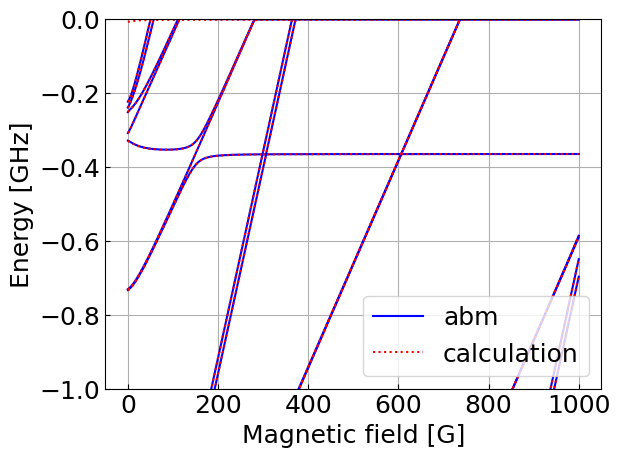

In [9]:
take = 6

srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_0_v2.json")
singlets = list(map(lambda x: x[1].to_dict(), singlets.items()))

triplets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_wave_functions_n_max_0_v2.json")
triplets = list(map(lambda x: x[1].to_dict(), triplets.items()))

singlet_energies = np.array(list(map(lambda x: x["energy"], singlets)))[0:take] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplets)))[0:take] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors_diff_grid(singlets[i], triplets[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_0_low_hifi.json")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = ":")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

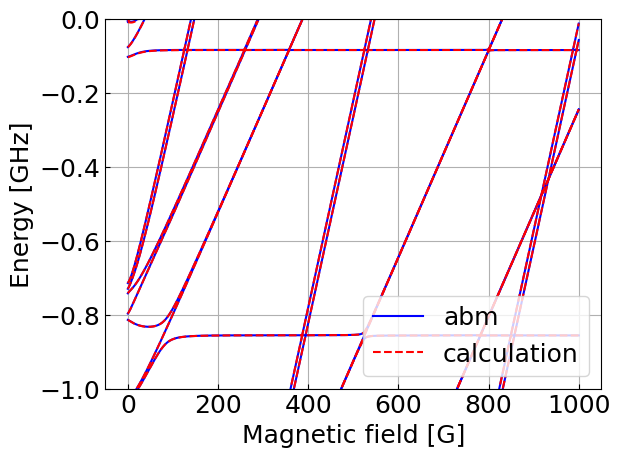

In [ ]:
take = 6

srf_rb_abm = abm.ABMProblemBuilder(srf, rb)
srf_rb_abm.with_projection(2)

singlets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_10_v2.json")
singlets = list(map(lambda x: x[1].to_dict(), singlets.items()))

triplets = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_triplet_wave_functions_n_max_10_v2.json")
triplets = list(map(lambda x: x[1].to_dict(), triplets.items()))

singlet_energies = np.array(list(map(lambda x: x["energy"], singlets)))[0:take] * GHZ
triplet_energies = np.array(list(map(lambda x: x["energy"], triplets)))[0:take] * GHZ

fc_factors = np.zeros((singlet_energies.shape[0], triplet_energies.shape[0]))
for i in range(fc_factors.shape[0]):
    for j in range(fc_factors.shape[1]):
        fc_factors[i, j] = calc_fc_factors_diff_grid(singlets[i], triplets[j])

srf_rb_abm.with_vibrational(singlet_energies, triplet_energies, fc_factors.flatten())

states_abm = np.array(srf_rb_abm.build().states_range(mag_fields)) / GHZ

fig, ax = utility.plot()
ax.plot(mag_fields, states_abm - states[:, 0:1], color = "blue")

bounds_single = BoundsDependence.parse_json(f"{DATA_PATH}/SrF_Rb_bound_states_n_max_10_low_hifi.json")
for state in bounds_single.states():
	ax.plot(state[:, 0], state[:, 1], color = "red", linestyle = "--")

ax.set_ylim(-1, 0)
ax.legend([ax.lines[0], ax.lines[-1]], ["abm", "calculation"], loc = "lower right")
ax.set_xlabel("Magnetic field [G]")
ax.set_ylabel("Energy [GHz]");

# fig.savefig(f"{SAVE_PATH}/SrF_Rb_n_175_abm_reduced_hifi.pdf", bbox_inches = "tight")

# WKB

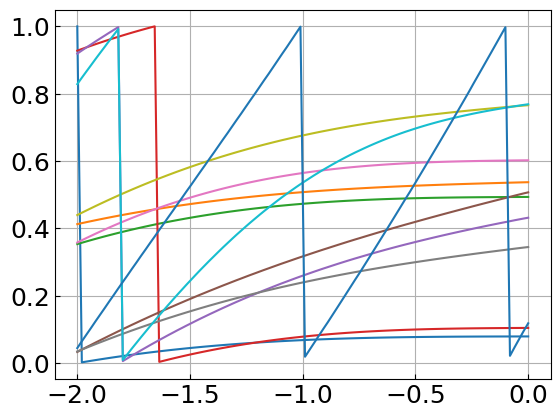

In [9]:
data = utility.load(f"{DATA_PATH}/SrF_Rb_singlet_wkb_test.dat")

fig, ax = utility.plot()
ax.plot(np.cbrt(data[:, 0]), data[:, 1:] % 1);

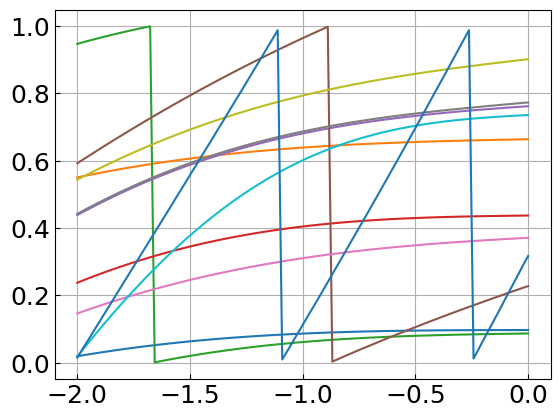

In [10]:
data = utility.load(f"{DATA_PATH}/SrF_Rb_singlet_wkb_scaled_1_02.dat")

fig, ax = utility.plot()
ax.plot(np.cbrt(data[:, 0]), data[:, 1:] % 1);

# Non adiabatic

(-20.0, 20.0)

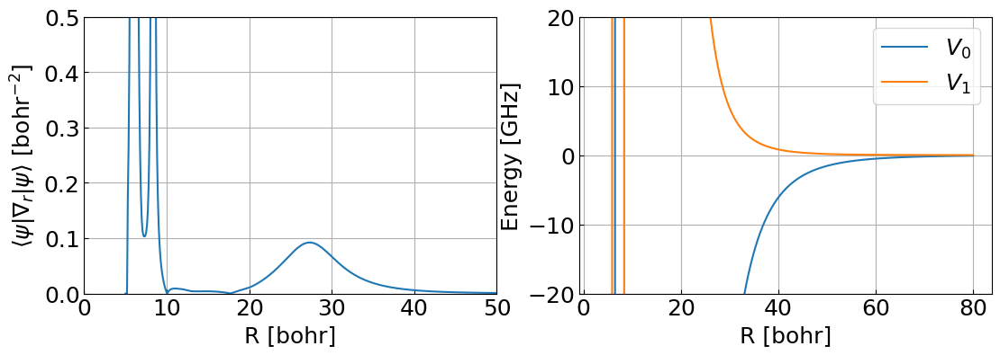

In [11]:
data = utility.load(f"{DATA_PATH}/srf_rb_singlet_non_adiabatic_n_1.dat")

fig, axes = utility.plot_many(1, 2, shape = (13, 4))
axes[0].plot(data[:, 0], data[:, 1:]);
axes[0].set_xlabel("R [bohr]")
axes[0].set_xlim(0, 80)
axes[0].set_ylabel(r"$\langle\psi|\nabla_r|\psi\rangle$ [bohr$^{-2}$]")

data = utility.load(f"{DATA_PATH}/SrF_Rb_singlet_dec_interpolated.dat")
scalings = data[:, 0]
values_legendre = data[:, 1:3]

axes[1].plot(scalings, values_legendre / GHZ)
axes[1].legend(["$V_0$", "$V_1$"])
axes[1].set_xlabel("R [bohr]")
axes[1].set_ylabel(r"Energy [GHz]")

axes[0].set_xlim(0, 50)
axes[0].set_ylim(0, 0.5)
axes[1].set_ylim(-20, 20)

(-20.0, 20.0)

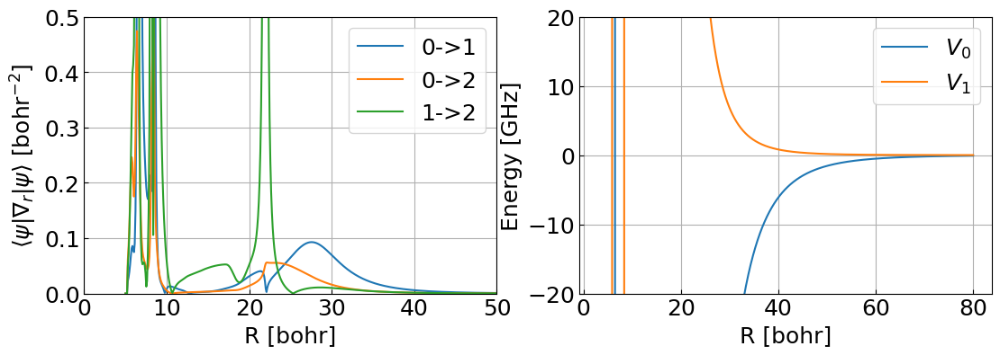

In [15]:
data = utility.load(f"{DATA_PATH}/srf_rb_singlet_non_adiabatic_n_2.dat")

fig, axes = utility.plot_many(1, 2, shape = (13, 4))
axes[0].plot(data[:, 0], data[:, 1:], label = ["0->1", "0->2", "1->2"])
axes[0].legend()
axes[0].set_xlabel("R [bohr]")
axes[0].set_ylabel(r"$\langle\psi|\nabla_r|\psi\rangle$ [bohr$^{-2}$]")

data = utility.load(f"{DATA_PATH}/SrF_Rb_singlet_dec_interpolated.dat")
scalings = data[:, 0]
values_legendre = data[:, 1:3]

axes[1].plot(scalings, values_legendre / GHZ)
axes[1].legend(["$V_0$", "$V_1$"])
axes[1].set_xlabel("R [bohr]")
axes[1].set_ylabel(r"Energy [GHz]")

axes[0].set_xlim(0, 50)
axes[0].set_ylim(0, 0.5)
axes[1].set_ylim(-20, 20)

(-20.0, 20.0)

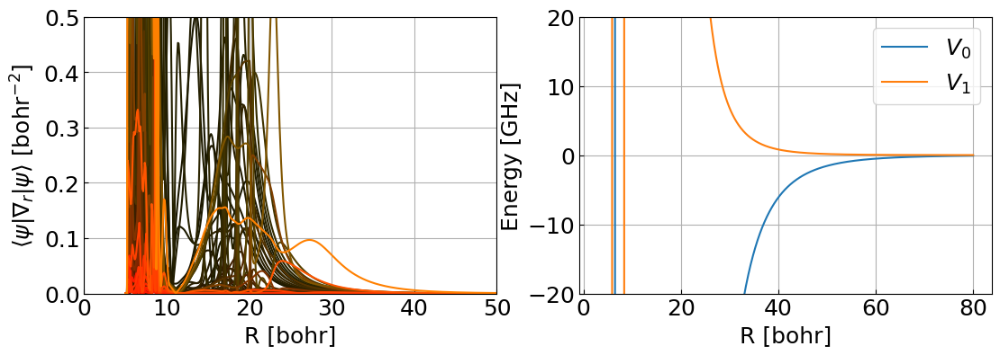

In [26]:
data = utility.load(f"{DATA_PATH}/srf_rb_singlet_non_adiabatic_n_10.dat")

colors = np.array([(1 / (i + 1), (1 / (j + 1)), 0) for i in range(11) for j in range(i + 1, 11)])
fig, axes = utility.plot_many(1, 2, shape = (13, 4))

for i, c in reversed(list(enumerate(colors))):
    axes[0].plot(data[:, 0], data[:, i + 1], color = c)

axes[0].set_xlabel("R [bohr]")
axes[0].set_xlim(0, 80)
axes[0].set_ylabel(r"$\langle\psi|\nabla_r|\psi\rangle$ [bohr$^{-2}$]")

data = utility.load(f"{DATA_PATH}/SrF_Rb_singlet_dec_interpolated.dat")
scalings = data[:, 0]
values_legendre = data[:, 1:3]

axes[1].plot(scalings, values_legendre / GHZ)
axes[1].legend(["$V_0$", "$V_1$"])
axes[1].set_xlabel("R [bohr]")
axes[1].set_ylabel(r"Energy [GHz]")

axes[0].set_xlim(0, 50)
axes[0].set_ylim(0, 0.5)
axes[1].set_ylim(-20, 20)

(-20.0, 20.0)

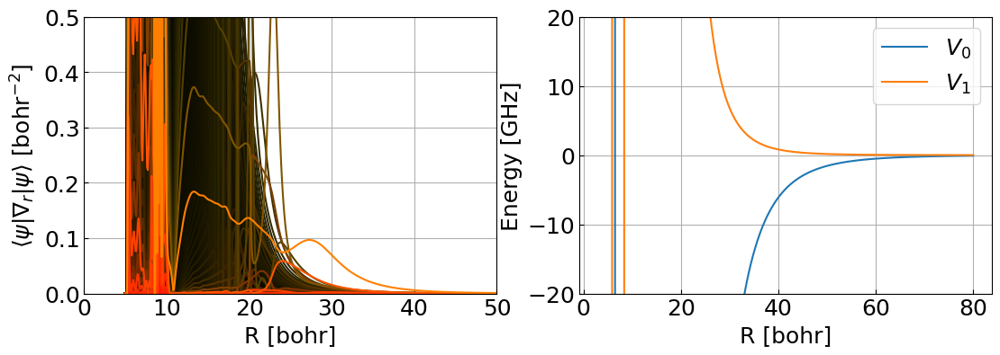

In [28]:
data = utility.load(f"{DATA_PATH}/srf_rb_singlet_non_adiabatic_n_175.dat")

colors = np.array([(1 / (i + 1), (1 / (j + 1)), 0) for i in range(176) for j in range(i + 1, 176)])
fig, axes = utility.plot_many(1, 2, shape = (13, 4))
for i, c in reversed(list(enumerate(colors))):
    axes[0].plot(data[:, 0], data[:, i + 1], color = c)
axes[0].set_xlabel("R [bohr]")
axes[0].set_xlim(0, 80)
axes[0].set_ylabel(r"$\langle\psi|\nabla_r|\psi\rangle$ [bohr$^{-2}$]")

data = utility.load(f"{DATA_PATH}/SrF_Rb_singlet_dec_interpolated.dat")
scalings = data[:, 0]
values_legendre = data[:, 1:3]

axes[1].plot(scalings, values_legendre / GHZ)
axes[1].legend(["$V_0$", "$V_1$"])
axes[1].set_xlabel("R [bohr]")
axes[1].set_ylabel(r"Energy [GHz]")

axes[0].set_xlim(0, 50)
axes[0].set_ylim(0, 0.5)
axes[1].set_ylim(-20, 20)

(-20.0, 20.0)

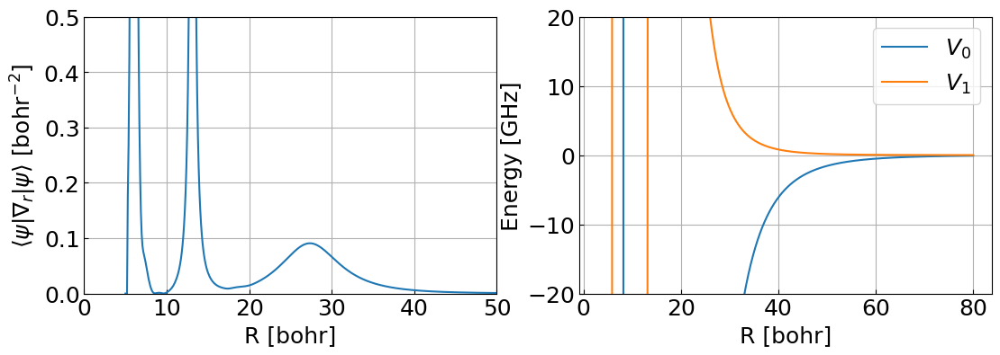

In [20]:
data = utility.load(f"{DATA_PATH}/srf_rb_triplet_non_adiabatic_n_1.dat")

fig, axes = utility.plot_many(1, 2, shape = (13, 4))
axes[0].plot(data[:, 0], data[:, 1:]);
axes[0].set_xlabel("R [bohr]")
axes[0].set_xlim(0, 80)
axes[0].set_ylabel(r"$\langle\psi|\nabla_r|\psi\rangle$ [bohr$^{-2}$]")

data = utility.load(f"{DATA_PATH}/SrF_Rb_triplet_dec_interpolated.dat")
scalings = data[:, 0]
values_legendre = data[:, 1:3]

axes[1].plot(scalings, values_legendre / GHZ)
axes[1].legend(["$V_0$", "$V_1$"])
axes[1].set_xlabel("R [bohr]")
axes[1].set_ylabel(r"Energy [GHz]")

axes[0].set_xlim(0, 50)
axes[0].set_ylim(0, 0.5)
axes[1].set_ylim(-20, 20)

(-20.0, 20.0)

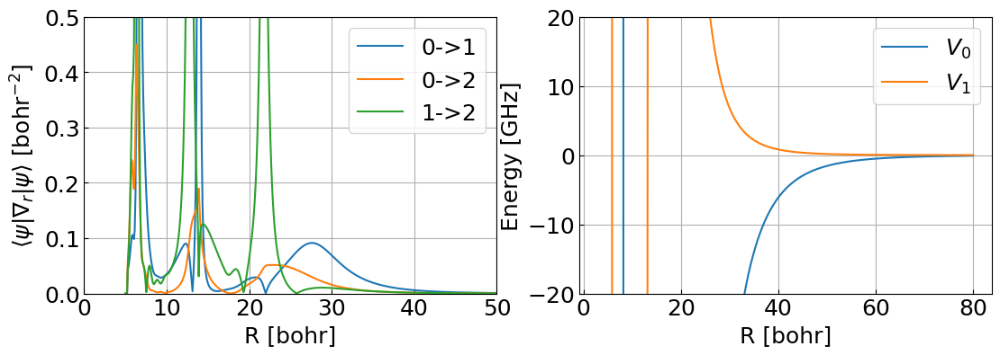

In [22]:
data = utility.load(f"{DATA_PATH}/srf_rb_triplet_non_adiabatic_n_2.dat")

fig, axes = utility.plot_many(1, 2, shape = (13, 4))
axes[0].plot(data[:, 0], data[:, 1:], label = ["0->1", "0->2", "1->2"])
axes[0].legend()
axes[0].set_xlabel("R [bohr]")
axes[0].set_ylabel(r"$\langle\psi|\nabla_r|\psi\rangle$ [bohr$^{-2}$]")

data = utility.load(f"{DATA_PATH}/SrF_Rb_triplet_dec_interpolated.dat")
scalings = data[:, 0]
values_legendre = data[:, 1:3]

axes[1].plot(scalings, values_legendre / GHZ)
axes[1].legend(["$V_0$", "$V_1$"])
axes[1].set_xlabel("R [bohr]")
axes[1].set_ylabel(r"Energy [GHz]")

axes[0].set_xlim(0, 50)
axes[0].set_ylim(0, 0.5)
axes[1].set_ylim(-20, 20)

(-20.0, 20.0)

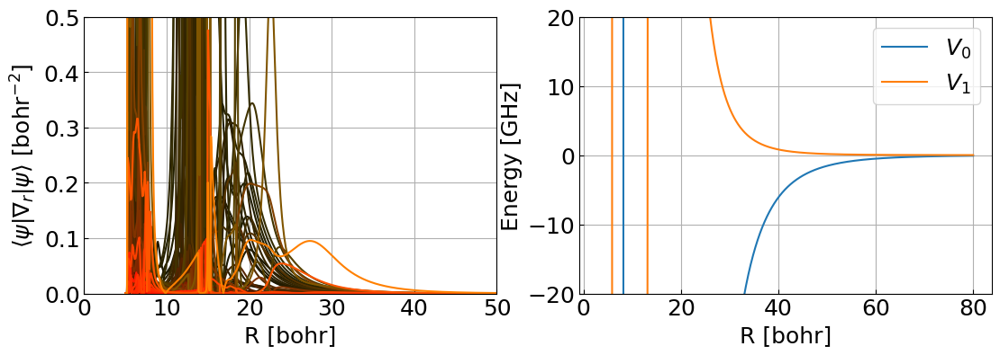

In [34]:
data = utility.load(f"{DATA_PATH}/srf_rb_triplet_non_adiabatic_n_10.dat")

colors = np.array([(1 / (i + 1), (1 / (j + 1)), 0) for i in range(11) for j in range(i + 1, 11)])
fig, axes = utility.plot_many(1, 2, shape = (13, 4))

for i, c in reversed(list(enumerate(colors))):
    axes[0].plot(data[:, 0], data[:, i + 1], color = c)
axes[0].set_xlabel("R [bohr]")
axes[0].set_xlim(0, 80)
axes[0].set_ylabel(r"$\langle\psi|\nabla_r|\psi\rangle$ [bohr$^{-2}$]")

data = utility.load(f"{DATA_PATH}/SrF_Rb_triplet_dec_interpolated.dat")
scalings = data[:, 0]
values_legendre = data[:, 1:3]

axes[1].plot(scalings, values_legendre / GHZ)
axes[1].legend(["$V_0$", "$V_1$"])
axes[1].set_xlabel("R [bohr]")
axes[1].set_ylabel(r"Energy [GHz]")

axes[0].set_xlim(0, 50)
axes[0].set_ylim(0, 0.5)
axes[1].set_ylim(-20, 20)

(-20.0, 20.0)

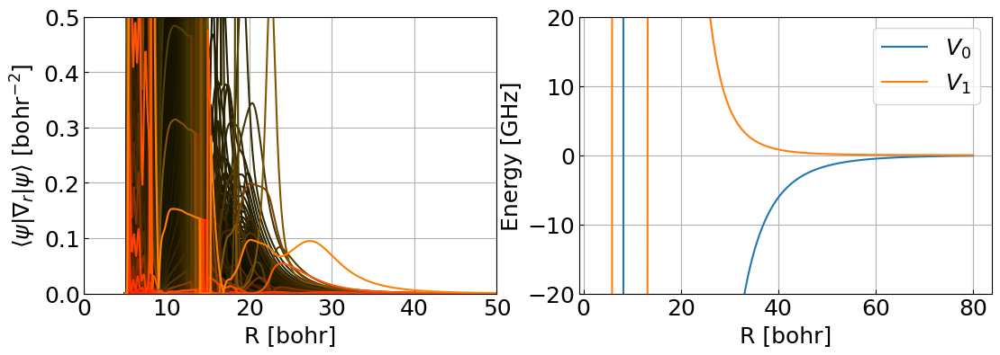

In [32]:
data = utility.load(f"{DATA_PATH}/srf_rb_triplet_non_adiabatic_n_175.dat")

colors = np.array([(1 / (i + 1), (1 / (j + 1)), 0) for i in range(176) for j in range(i + 1, 176)])
fig, axes = utility.plot_many(1, 2, shape = (13, 4))

for i, c in reversed(list(enumerate(colors))):
    axes[0].plot(data[:, 0], data[:, i + 1], color = c)
axes[0].set_xlabel("R [bohr]")
axes[0].set_xlim(0, 80)
axes[0].set_ylabel(r"$\langle\psi|\nabla_r|\psi\rangle$ [bohr$^{-2}$]")

data = utility.load(f"{DATA_PATH}/SrF_Rb_triplet_dec_interpolated.dat")
scalings = data[:, 0]
values_legendre = data[:, 1:3]

axes[1].plot(scalings, values_legendre / GHZ)
axes[1].legend(["$V_0$", "$V_1$"])
axes[1].set_xlabel("R [bohr]")
axes[1].set_ylabel(r"Energy [GHz]")

axes[0].set_xlim(0, 50)
axes[0].set_ylim(0, 0.5)
axes[1].set_ylim(-20, 20)

# new scalings n_max = 10

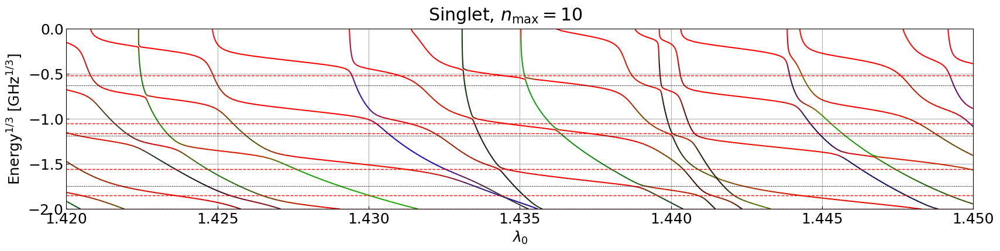

In [ ]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_field_json(f"{DATA_PATH}/SrF_Rb_field_singlet_scaling_full_n_max_10_scaling_1_43.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda$")
ax.set_ylim(-2, 0);
ax.set_xlim(1.42, 1.45)

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

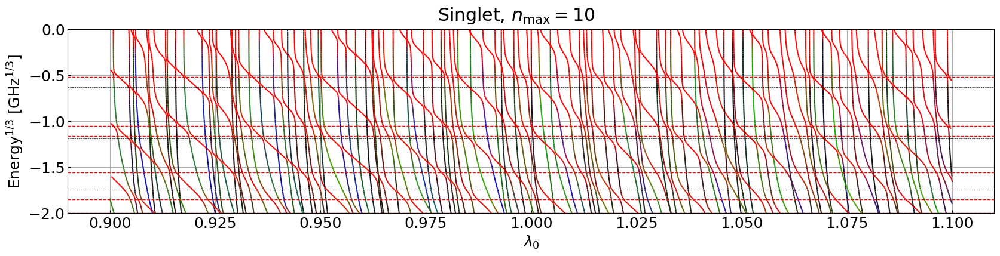

In [ ]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_field_json(f"{DATA_PATH}/SrF_Rb_field_singlet_scaling_full_n_max_10_scaling_1_00.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda$")
ax.set_ylim(-2, 0);

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

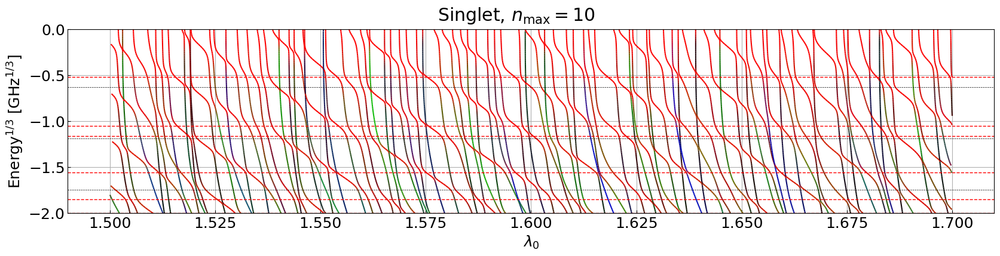

In [ ]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_field_json(f"{DATA_PATH}/SrF_Rb_field_singlet_scaling_full_n_max_10_scaling_1_6.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda$")
ax.set_ylim(-2, 0);

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

interactive(children=(IntSlider(value=0, description='scaling_index', max=80), Output()), _dom_classes=('widge…

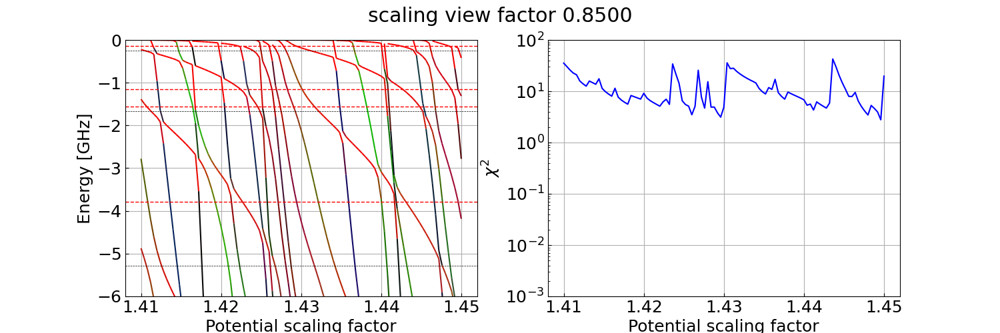

In [13]:
# triplet n = 10 2d scaling zoomed
%matplotlib widget

bounds_singlet_2d_zoomed = BoundsDependence2D.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_2d_scaling_n_max_10_scaling_1_43.json")
fig, axes = plot_2d(bounds_singlet_2d_zoomed, reference_singlet_scaled_1)

label = "Potential scaling factor"

axes[0].set_ylabel(f"Energy [GHz]")
axes[0].set_xlabel(label)
axes[0].set_ylim(-6, 0)

axes[1].set_yscale("log")
axes[1].set_ylim(1e-3, 1e2)
axes[1].set_ylabel(r"$\chi^2$")
axes[1].set_xlabel(label);

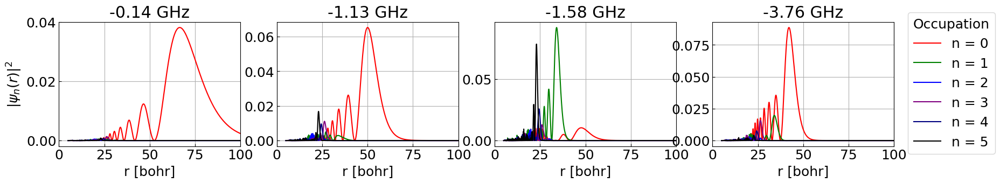

In [12]:
n_max = 5
take = 4

wave_functions = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_10_scaling_1_43.json", n_max + 1)

fig, axes = utility.plot_many(1, take, shape = (5 * take, 3))
axes[0].set_ylabel(r"$|\psi_n(r)|^2$")

for i, (n, wave) in itertools.islice(enumerate(wave_functions.items()), take):
    for j in range(wave.values.shape[1]):
        axes[i].plot(wave.distances, wave.values[:, j] ** 2, color = colors[j])

    axes[i].set_xlabel("r [bohr]")
    axes[i].set_title(f"{wave.energy:.2f} GHz")
    axes[i].set_xlim(0, 100)

fig.legend([f"n = {j}" for j in range(n_max + 1)],
           loc='center right', bbox_to_anchor=(1, 0.5),
           title='Occupation');

# fig.savefig(f"{SAVE_PATH}/wave_function_singlet_scaled_n_10.pdf", bbox_inches = "tight")

interactive(children=(IntSlider(value=0, description='scaling_index', max=80), Output()), _dom_classes=('widge…

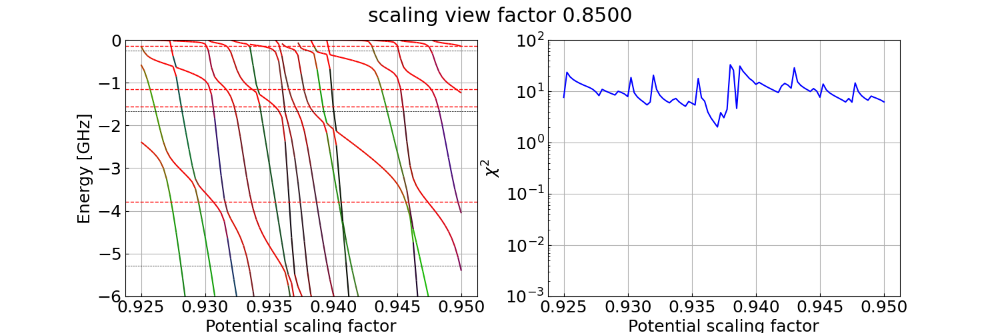

In [26]:
# triplet n = 10 2d scaling zoomed
%matplotlib widget

bounds_singlet_2d_zoomed = BoundsDependence2D.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_2d_scaling_n_max_10_scaling_0_93.json")
fig, axes = plot_2d(bounds_singlet_2d_zoomed, reference_singlet_scaled_1)

label = "Potential scaling factor"

axes[0].set_ylabel(f"Energy [GHz]")
axes[0].set_xlabel(label)
axes[0].set_ylim(-6, 0)

axes[1].set_yscale("log")
axes[1].set_ylim(1e-3, 1e2)
axes[1].set_ylabel(r"$\chi^2$")
axes[1].set_xlabel(label);

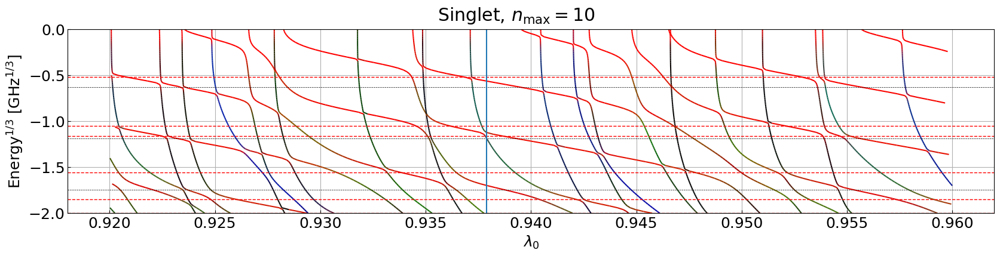

In [10]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_field_json(f"{DATA_PATH}/SrF_Rb_field_singlet_scaling_full_n_max_10_scaling_0_93_0_9.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);

ax.axvline(0.9379)

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

0.9389302523757846, 0.976730434834512

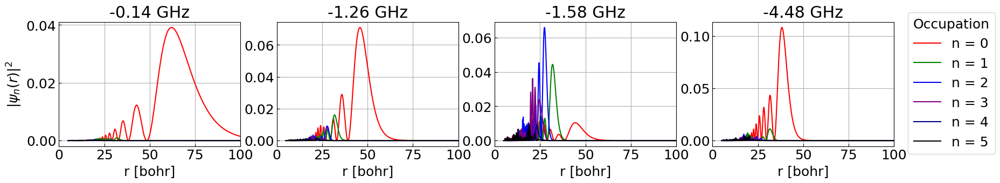

In [ ]:
%matplotlib inline
n_max = 5
take = 4

wave_functions = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_10_scaling_0_93.json", n_max + 1)

fig, axes = utility.plot_many(1, take, shape = (5 * take, 3))
axes[0].set_ylabel(r"$|\psi_n(r)|^2$")

for i, (n, wave) in itertools.islice(enumerate(wave_functions.items()), take):
    for j in range(wave.values.shape[1]):
        axes[i].plot(wave.distances, wave.values[:, j] ** 2, color = colors[j])

    axes[i].set_xlabel("r [bohr]")
    axes[i].set_title(f"{wave.energy:.2f} GHz")
    axes[i].set_xlim(0, 100)

fig.legend([f"n = {j}" for j in range(n_max + 1)],
           loc='center right', bbox_to_anchor=(1, 0.5),
           title='Occupation');

# fig.savefig(f"{SAVE_PATH}/wave_f unction_singlet_scaled_n_10.pdf", bbox_inches = "tight")

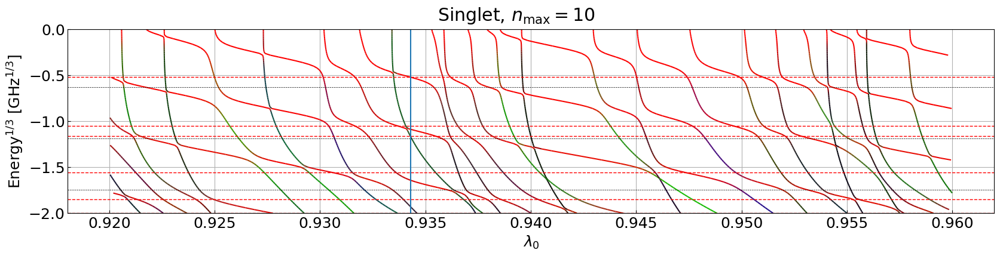

In [21]:
fig, ax = utility.plot(shape = (20, 4))

bounds = BoundsDependence.parse_field_json(f"{DATA_PATH}/SrF_Rb_field_singlet_scaling_full_n_max_10_scaling_0_93_0_85.json")

plot_bounds(ax, bounds)

for b in reference_singlet_scaled_1:
    ax.axhline(np.cbrt(b), color = "red", linestyle="--", linewidth=1)

for b in BINS:
    ax.axhline(np.cbrt(b), color = "black", linestyle="--", linewidth=0.5)

ax.set_ylabel("Energy$^{1/3}$ [GHz$^{1/3}$]")
ax.set_xlabel(r"$\lambda_0$")
ax.set_ylim(-2, 0);

ax.axvline(0.9343)

# fig.savefig(f"{SAVE_PATH}/srf_rb_singlet_bounds_n_10.pdf", bbox_inches = "tight")
fig.suptitle(r"Singlet, $n_\text{max} = 10$");

0.9342861200310975, 0.8500507286171404

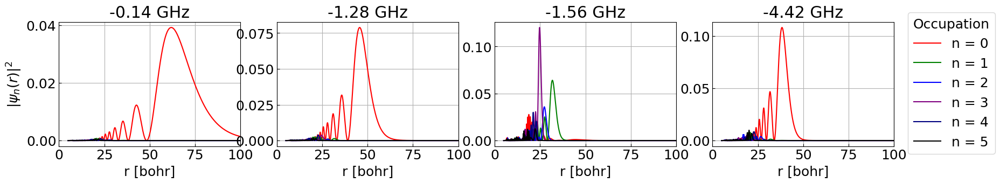

In [25]:
%matplotlib inline
n_max = 5
take = 4

wave_functions = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_10_scaling_0_93_0_85.json", n_max + 1)

fig, axes = utility.plot_many(1, take, shape = (5 * take, 3))
axes[0].set_ylabel(r"$|\psi_n(r)|^2$")

for i, (n, wave) in itertools.islice(enumerate(wave_functions.items()), take):
    for j in range(wave.values.shape[1]):
        axes[i].plot(wave.distances, wave.values[:, j] ** 2, color = colors[j])

    axes[i].set_xlabel("r [bohr]")
    axes[i].set_title(f"{wave.energy:.2f} GHz")
    axes[i].set_xlim(0, 100)

fig.legend([f"n = {j}" for j in range(n_max + 1)],
           loc='center right', bbox_to_anchor=(1, 0.5),
           title='Occupation');

# fig.savefig(f"{SAVE_PATH}/wave_function_singlet_scaled_n_10.pdf", bbox_inches = "tight")

interactive(children=(IntSlider(value=0, description='scaling_index', max=80), Output()), _dom_classes=('widge…

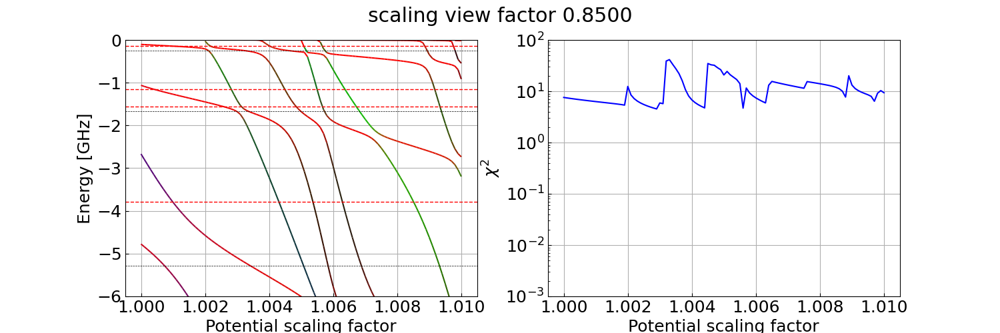

In [27]:
# triplet n = 10 2d scaling zoomed
%matplotlib widget

bounds_singlet_2d_zoomed = BoundsDependence2D.parse_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_2d_scaling_n_max_10_scaling_1_00.json")
fig, axes = plot_2d(bounds_singlet_2d_zoomed, reference_singlet_scaled_1)

label = "Potential scaling factor"

axes[0].set_ylabel(f"Energy [GHz]")
axes[0].set_xlabel(label)
axes[0].set_ylim(-6, 0)

axes[1].set_yscale("log")
axes[1].set_ylim(1e-3, 1e2)
axes[1].set_ylabel(r"$\chi^2$")
axes[1].set_xlabel(label);

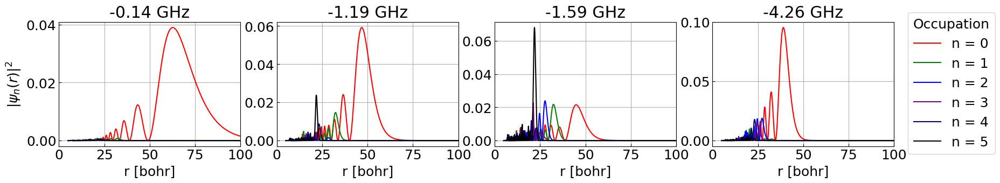

In [29]:
%matplotlib inline
n_max = 5
take = 4

wave_functions = wavefunction_json(f"{DATA_PATH}/SrF_Rb_bounds_singlet_wave_functions_n_max_10_scaling_1_01_1_00.json", n_max + 1)

fig, axes = utility.plot_many(1, take, shape = (5 * take, 3))
axes[0].set_ylabel(r"$|\psi_n(r)|^2$")

for i, (n, wave) in itertools.islice(enumerate(wave_functions.items()), take):
    for j in range(wave.values.shape[1]):
        axes[i].plot(wave.distances, wave.values[:, j] ** 2, color = colors[j])

    axes[i].set_xlabel("r [bohr]")
    axes[i].set_title(f"{wave.energy:.2f} GHz")
    axes[i].set_xlim(0, 100)

fig.legend([f"n = {j}" for j in range(n_max + 1)],
           loc='center right', bbox_to_anchor=(1, 0.5),
           title='Occupation');

# fig.savefig(f"{SAVE_PATH}/wave_function_singlet_scaled_n_10.pdf", bbox_inches = "tight")